In [1]:
import librosa
import IPython.display as ipd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

In [2]:
reduction_rate = 4  # melspectrogram reduction rate, don't change because SSRN is using this rate
n_fft = 2048 # fft points (samples)
n_mels = 80  # Number of Mel banks to generate
power = 1.5  # Exponent for amplifying the predicted magnitude
n_iter = 50  # Number of inversion iterations
preemphasis = .97
max_db = 100
ref_db = 20
sr = 22050  # Sampling rate
frame_shift = 0.0125  # seconds
frame_length = 0.05  # seconds
hop_length = int(sr * frame_shift)  # samples. =276.
win_length = int(sr * frame_length)  # samples. =1102.

In [3]:
def trim_custom(audio, begin_db=25, end_db=40):
    begin = librosa.effects.trim(audio, top_db=begin_db)[1][0]
    end = librosa.effects.trim(audio, top_db=end_db)[1][1]
    return audio[begin:end]

In [4]:
def show_trimmed(source, split_list):
    for part in split_list:
        audio = trim_custom(source[slice(*part)])
        ipd.display(ipd.Audio(audio, rate=sr))
        plt.figure(figsize=(14, 5))
        librosa.display.waveplot(audio, sr=sr)
        plt.show()

In [5]:
y, _ = librosa.load('datasets/Yennefer/wavs/0x000904a8.wav', sr=sr)
ipd.Audio(y, rate=sr)

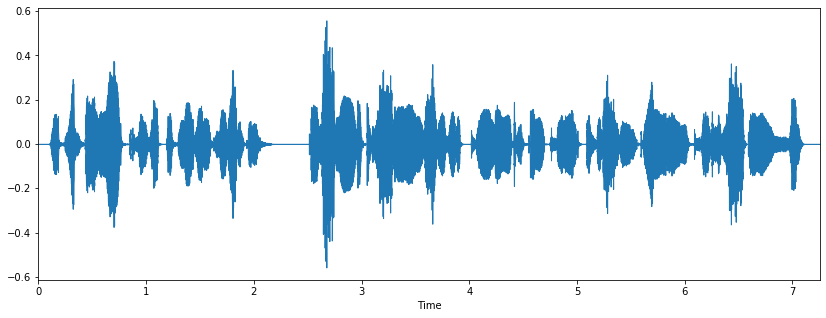

In [6]:
# original
plt.figure(figsize=(14, 5))
librosa.display.waveplot(y, sr=sr)
plt.show()

In [7]:
y_split = librosa.effects.split(y, top_db=60)
y_split

array([[  1536,  49152],
       [ 54784, 157696]])

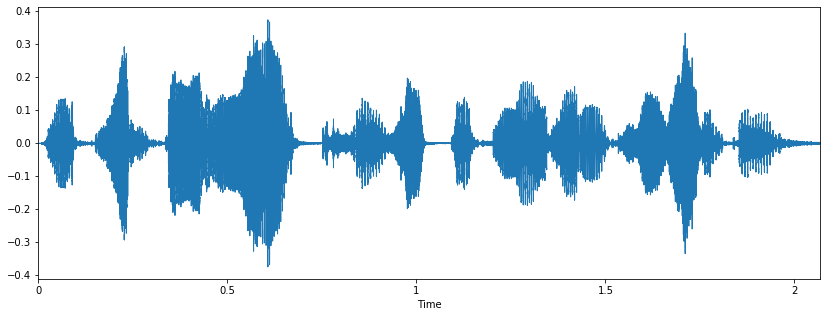

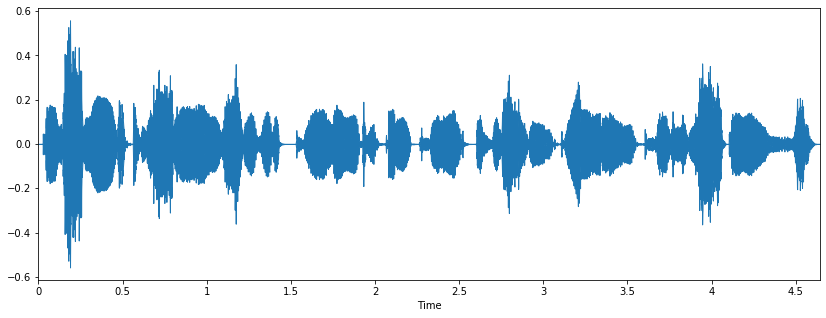

In [8]:
show_trimmed(y, y_split)

## Another one

In [9]:
y2, _ = librosa.load('datasets/Yennefer/wavs/0x000ffc47.wav', sr=sr)
ipd.Audio(y2, rate=sr)

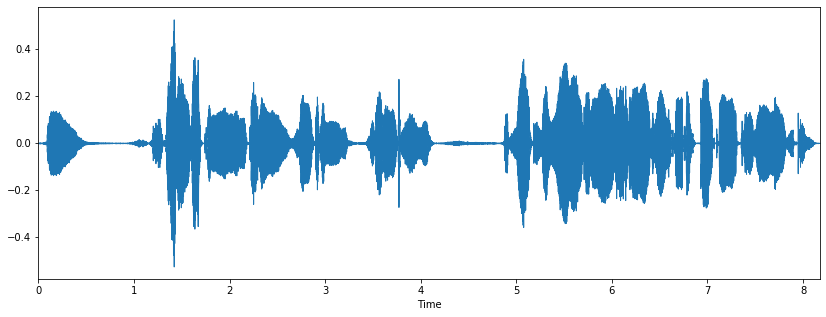

In [10]:
# original
plt.figure(figsize=(14, 5))
librosa.display.waveplot(y2, sr=sr)
plt.show()

In [11]:
y2p = np.append(y2[0], y2[1:] - preemphasis * y2[:-1])
ipd.Audio(y2p, rate=sr)

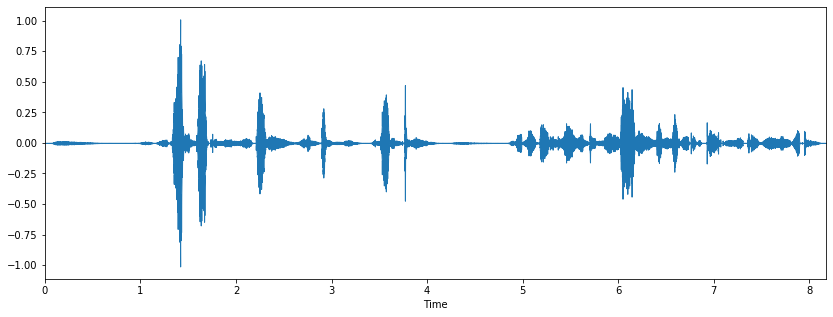

In [12]:
# preemphasis
plt.figure(figsize=(14, 5))
librosa.display.waveplot(y2p, sr=sr)
plt.show()

In [13]:
y2_split = librosa.effects.split(y2p, top_db=60)
y2_split

array([[  1024,  14848],
       [ 20992,  92160],
       [ 93184, 105472],
       [105984, 180224]])

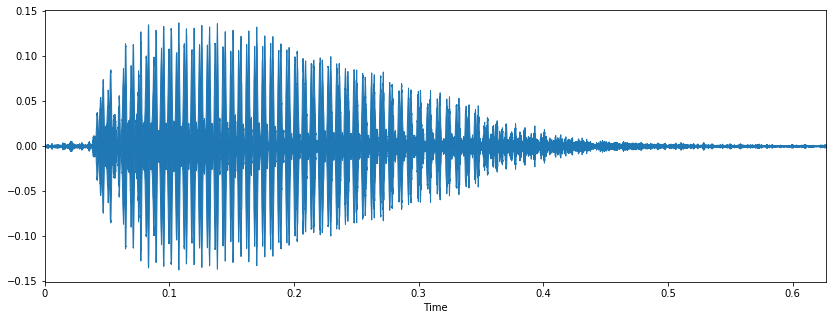

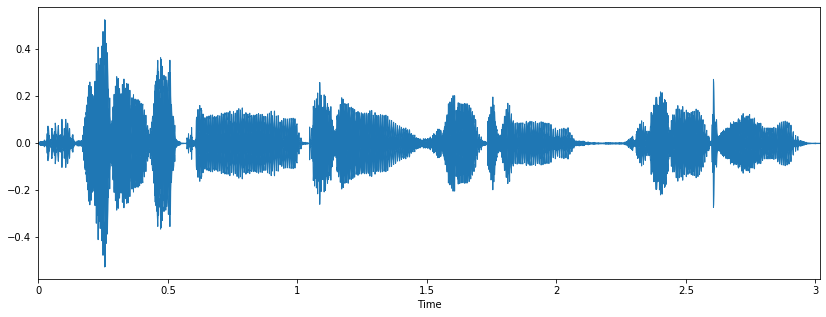

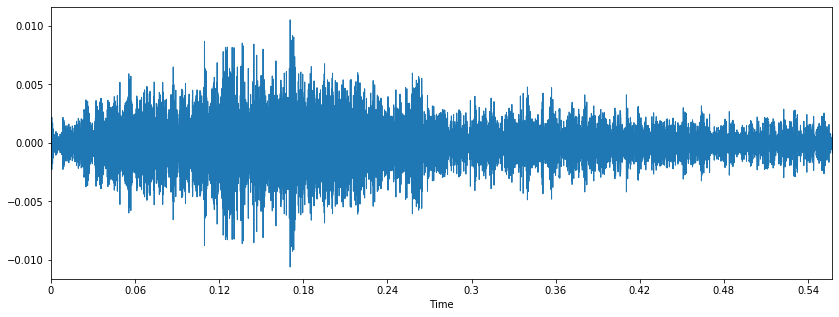

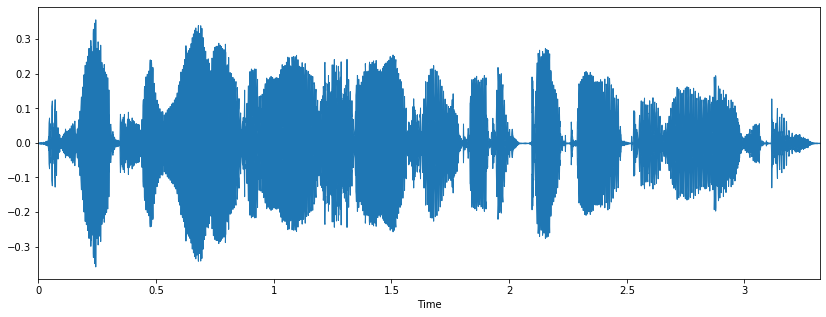

In [14]:
show_trimmed(y2, y2_split)

## Another

In [15]:
y3, _ = librosa.load('datasets/Yennefer/wavs/0x000ffb90.wav', sr=sr)
ipd.Audio(y3, rate=sr)

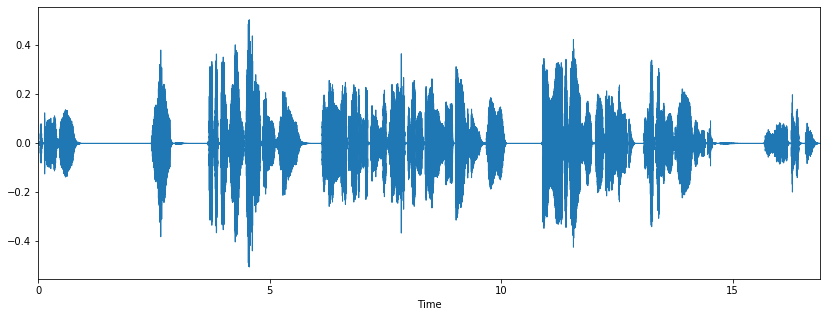

In [16]:
# original
plt.figure(figsize=(14, 5))
librosa.display.waveplot(y3, sr=sr)
plt.show()

In [17]:
y3p = np.append(y3[0], y3[1:] - preemphasis * y3[:-1])
ipd.Audio(y3p, rate=sr)

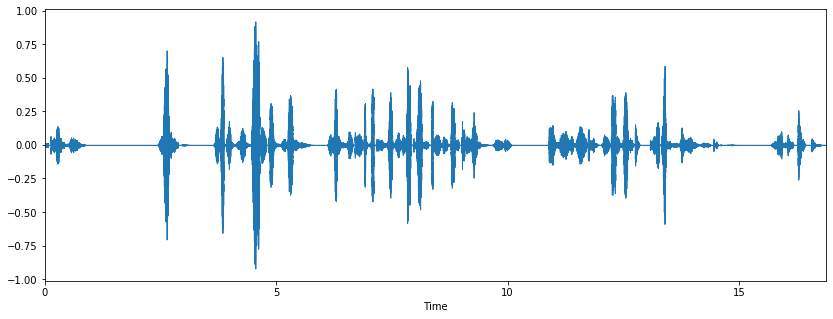

In [18]:
# preemphasis
plt.figure(figsize=(14, 5))
librosa.display.waveplot(y3p, sr=sr)
plt.show()

In [19]:
y3_split = librosa.effects.split(y3p, top_db=60)
y3_split

array([[     0,  20480],
       [ 52736,  69120],
       [ 79872, 128000],
       [134144, 223232],
       [238592, 284672],
       [287744, 323584],
       [324608, 330240],
       [345088, 363520],
       [364544, 371200]])

In [20]:
def fix_split(split_list):
    fixed = []
    i = 0
    while i < len(split_list):
        size = np.diff(split_list[i])
        if i != len(split_list) - 1:
            diff = split_list[i+1][0] - split_list[i][1]
            if diff < 1500:
                merged = [split_list[i][0], split_list[i+1][1]]
                fixed.append(merged)
                i += 1
            else:
                fixed.append(split_list[i])
        else:
            fixed.append(split_list[i])
        i += 1
    return fixed

In [21]:
y3_split_fix = fix_split(y3_split)
y3_split_fix

[array([    0, 20480]),
 array([52736, 69120]),
 array([ 79872, 128000]),
 array([134144, 223232]),
 array([238592, 284672]),
 [287744, 330240],
 [345088, 371200]]

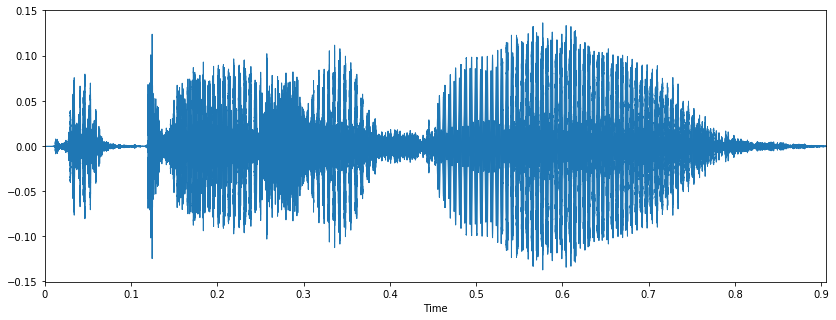

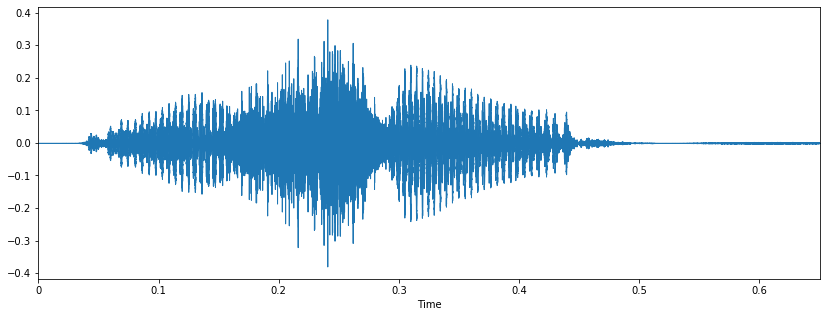

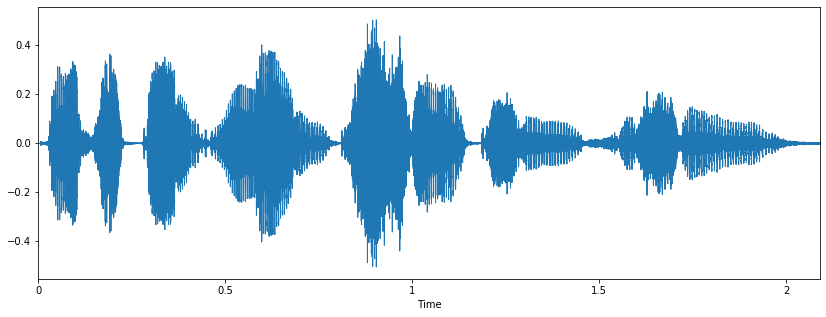

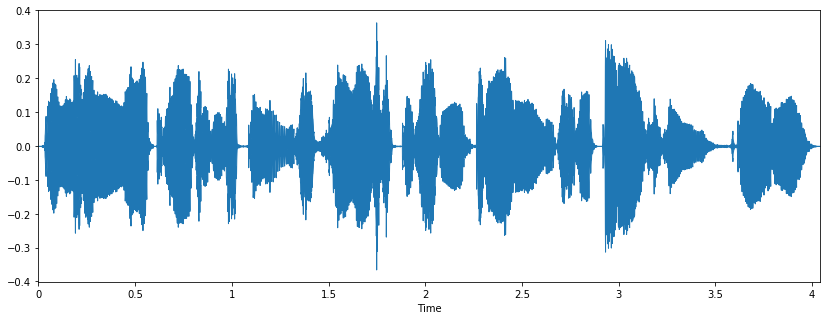

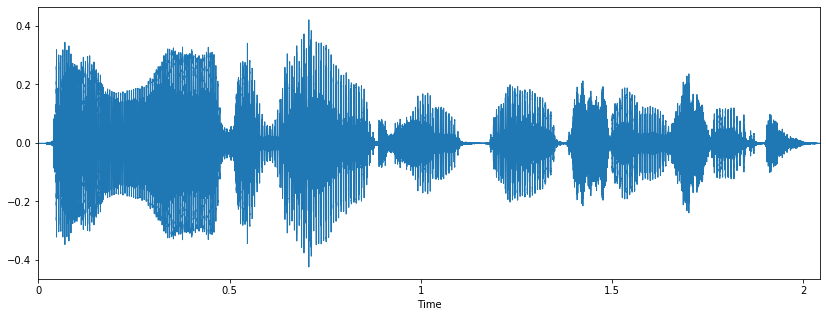

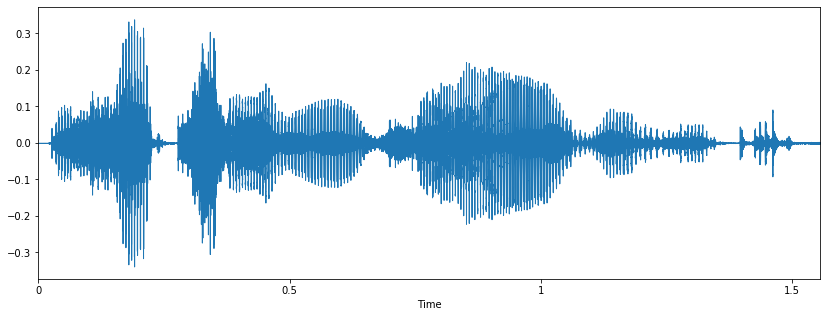

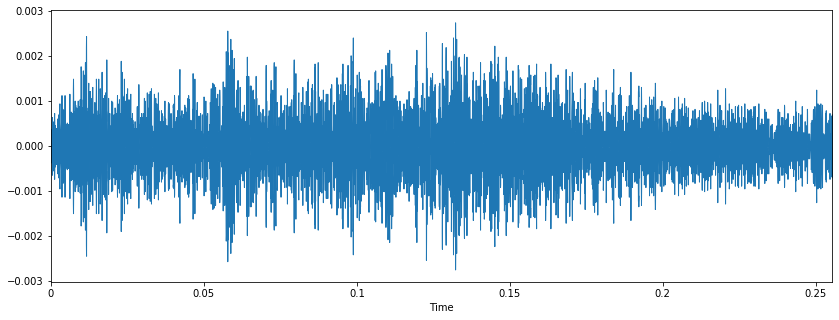

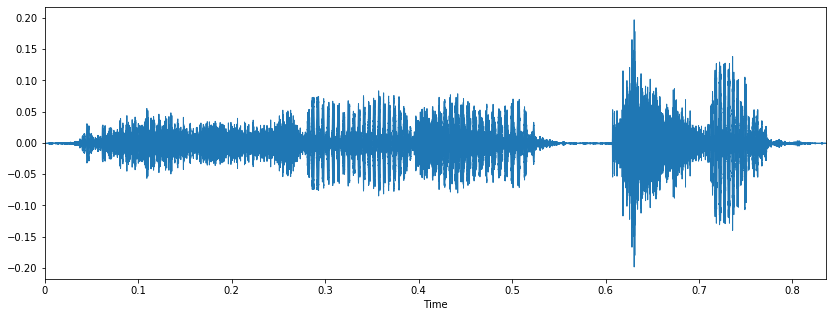

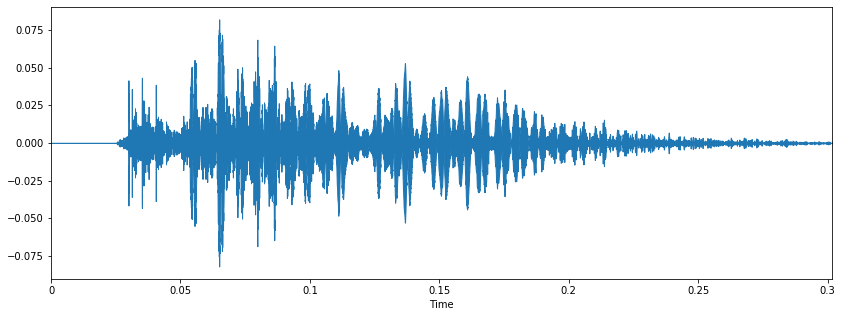

In [22]:
show_trimmed(y3, y3_split)

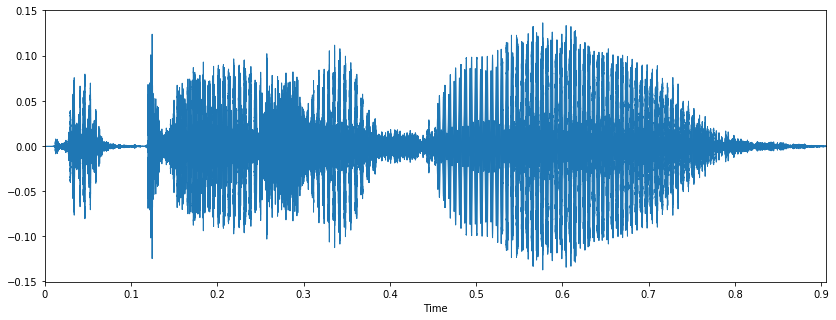

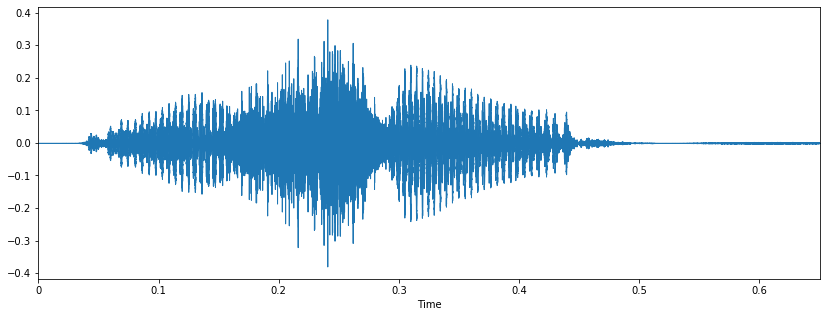

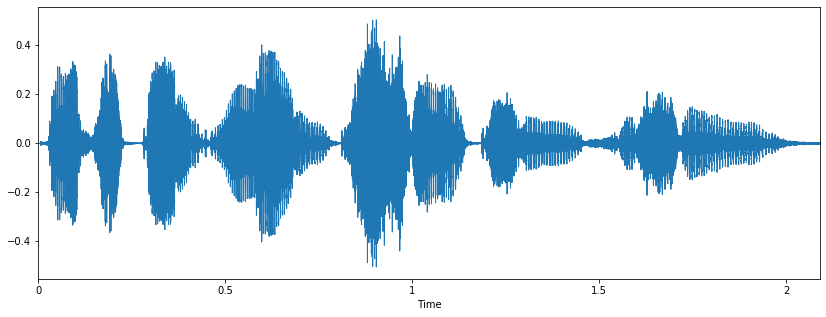

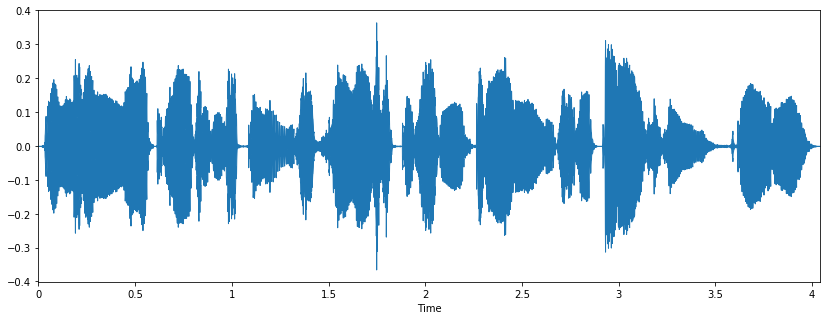

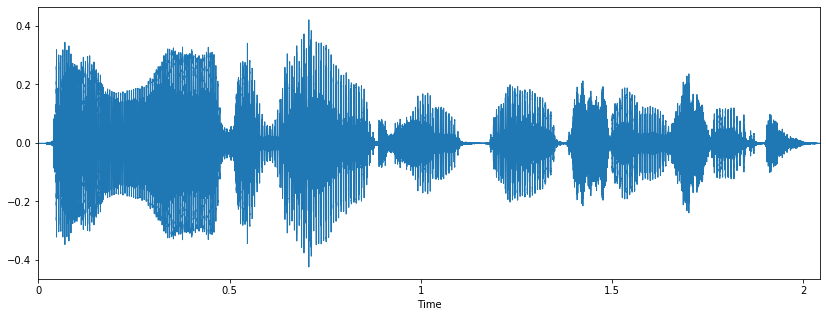

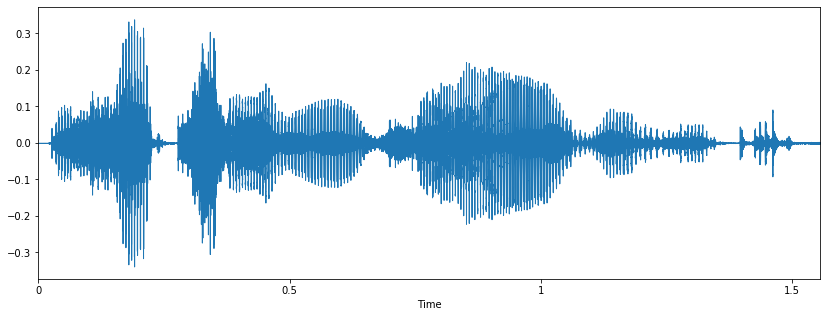

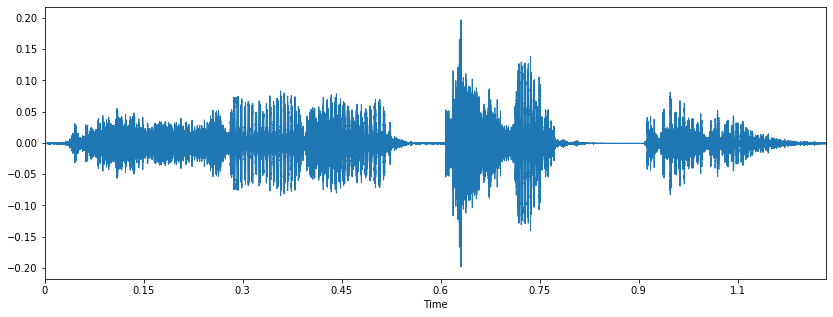

In [23]:
show_trimmed(y3, y3_split_fix)

## one more

In [33]:
y4, _ = librosa.load('datasets/Yennefer/wavs/0x000ffb7a.wav', sr=sr)
ipd.Audio(y4, rate=sr)

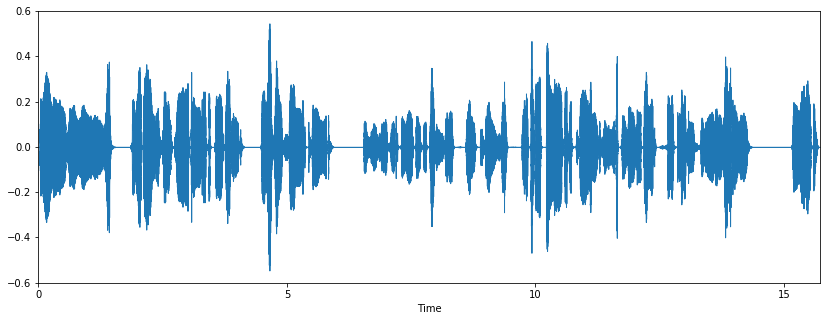

In [34]:
# original
plt.figure(figsize=(14, 5))
librosa.display.waveplot(y4, sr=sr)
plt.show()

In [48]:
def split_audio_to_list(source, min_diff=1500, db=60):
    split_list = librosa.effects.split(np.append(source[0], source[1:] - preemphasis * source[:-1]), top_db=db)
    fixed = []
    i = 0
    while i < len(split_list):
        size = np.diff(split_list[i])
        if i != len(split_list) - 1:
            diff = split_list[i+1][0] - split_list[i][1]
            if diff < min_diff:
                merged = [split_list[i][0], split_list[i+1][1]]
                fixed.append(merged)
                i += 1
            else:
                fixed.append(split_list[i])
        else:
            fixed.append(split_list[i])
        i += 1
    return fixed

In [37]:
y4_split = split_audio_to_list(y4)
y4_split

[array([    0, 34304]),
 array([39936, 92160]),
 array([ 97792, 131584]),
 array([143360, 209408]),
 array([213504, 316928]),
 array([333312, 346655])]

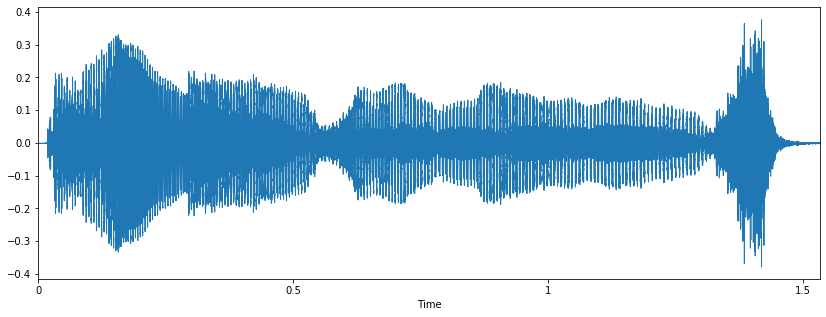

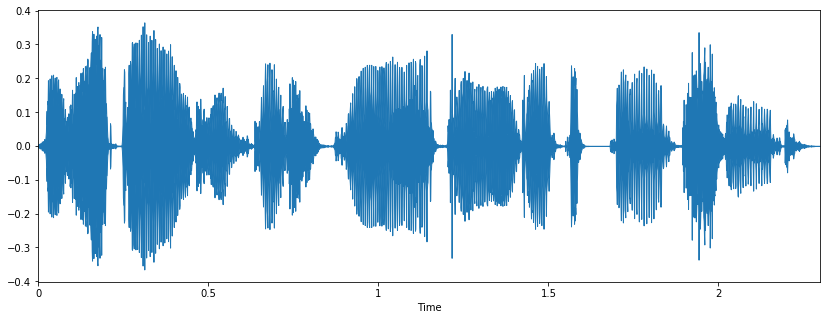

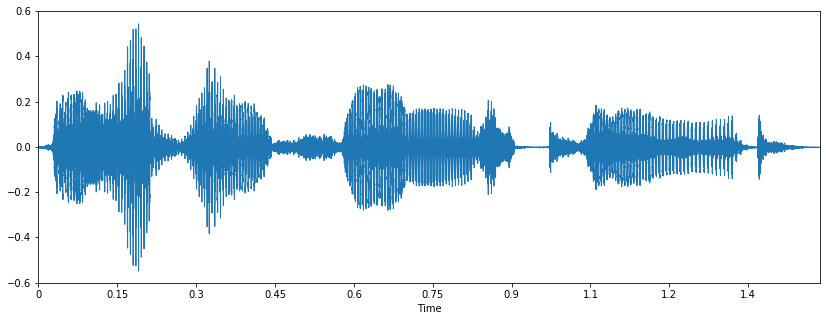

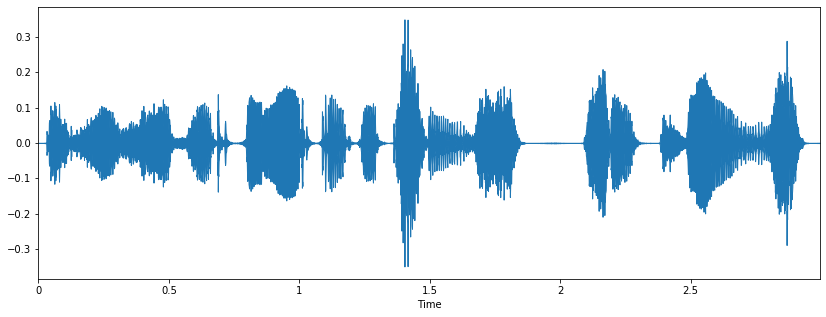

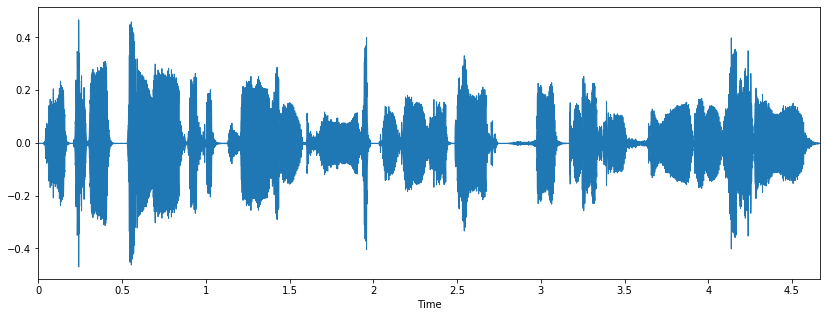

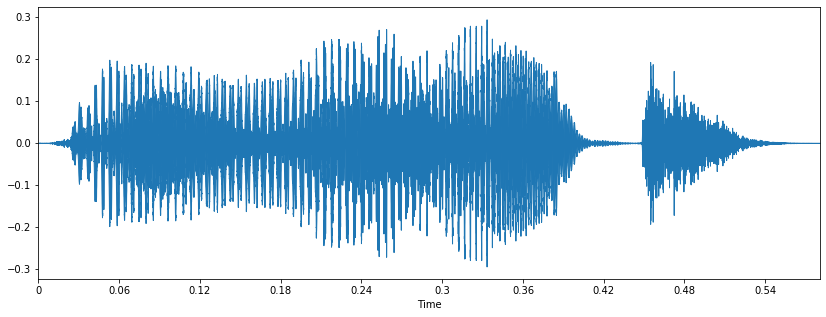

In [38]:
show_trimmed(y4, y4_split)

## Audio with effects (reverberated)

In [39]:
y5, _ = librosa.load('datasets/Yennefer/wavs/0x00121595.wav', sr=sr)
ipd.Audio(y5, rate=sr)

In [40]:
y5_split = split_audio_to_list(y5)
y5_split

[array([ 1536, 88576]), array([ 94208, 234496]), array([242176, 316928])]

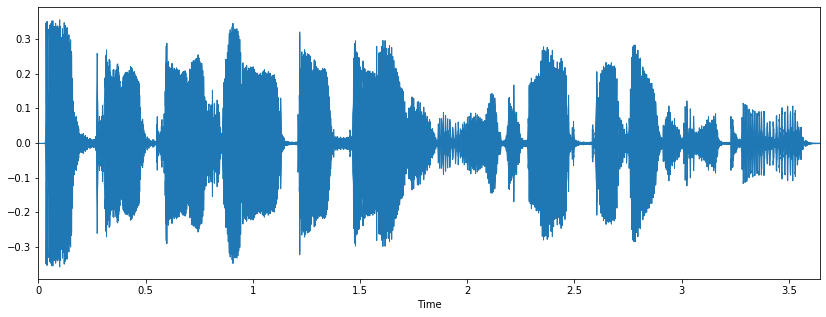

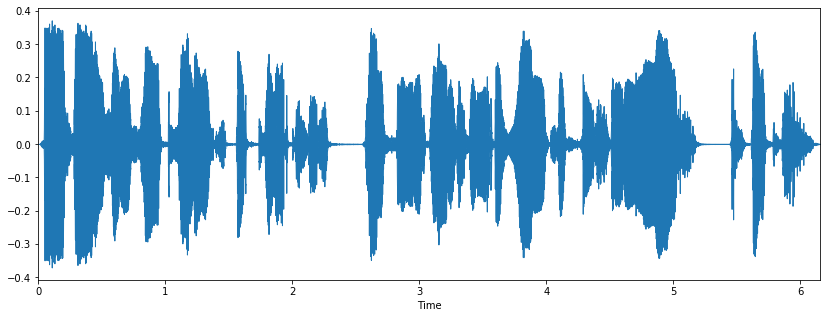

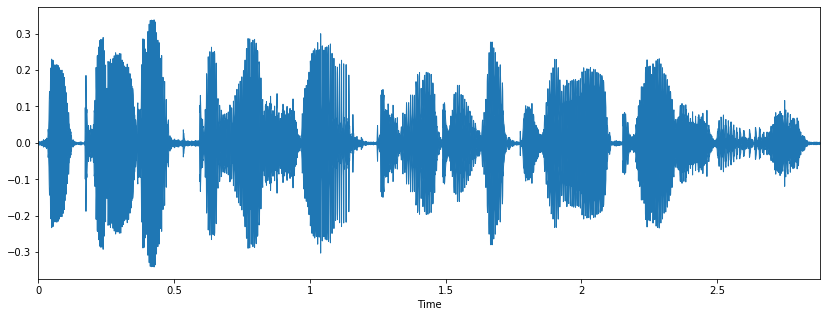

In [41]:
show_trimmed(y5, y5_split)

In [42]:
y6, _ = librosa.load('datasets/Yennefer/wavs/0x000893cf.wav', sr=sr)
ipd.Audio(y6, rate=sr)

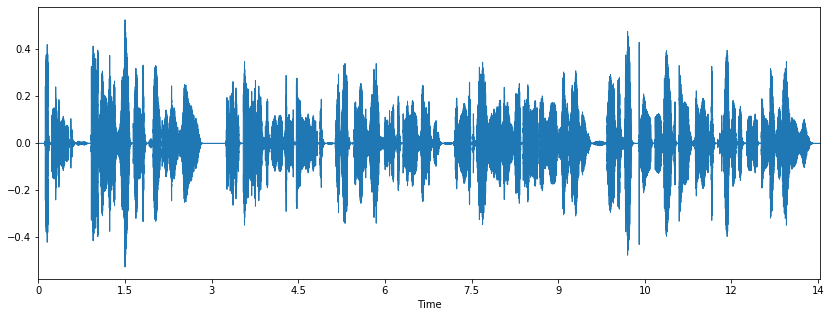

In [44]:
# original
plt.figure(figsize=(14, 5))
librosa.display.waveplot(y6, sr=sr)
plt.show()

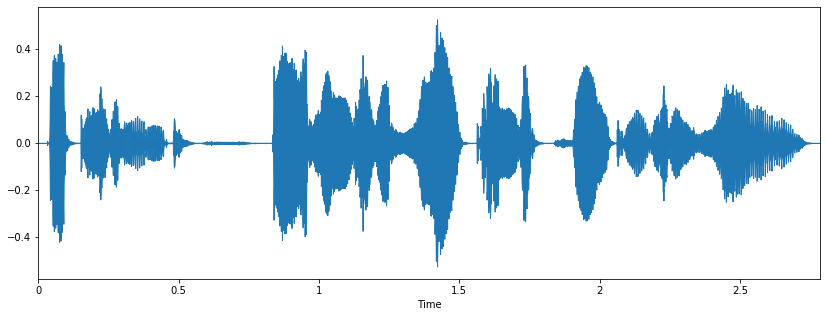

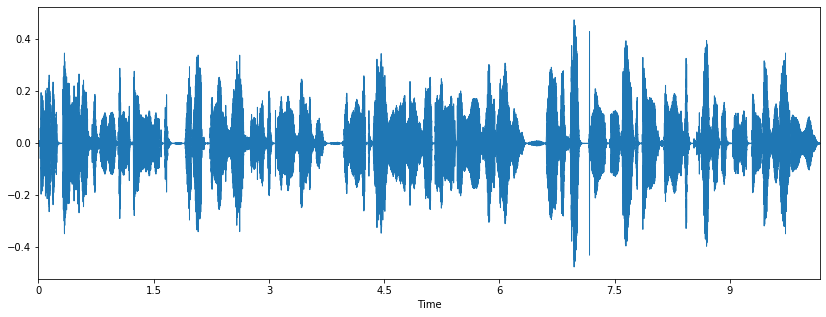

In [51]:
y6_split = split_audio_to_list(y6)
show_trimmed(y6, y6_split)

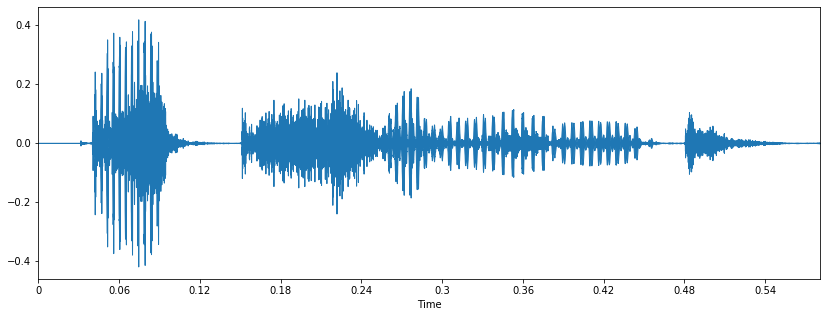

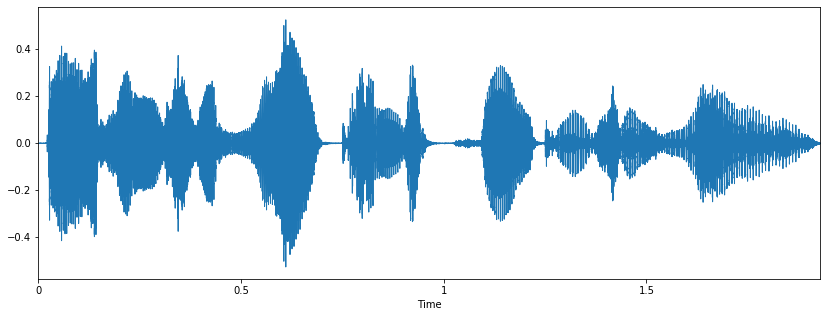

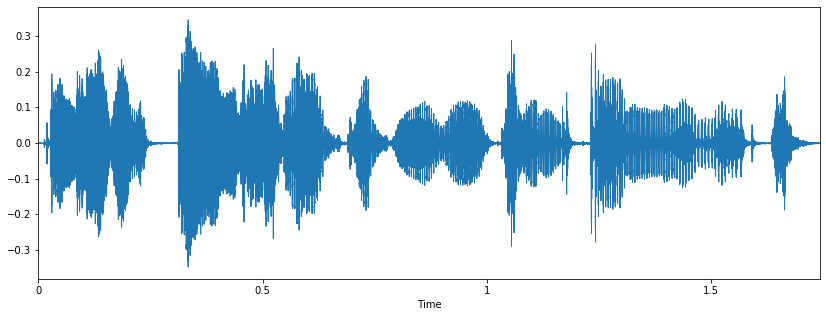

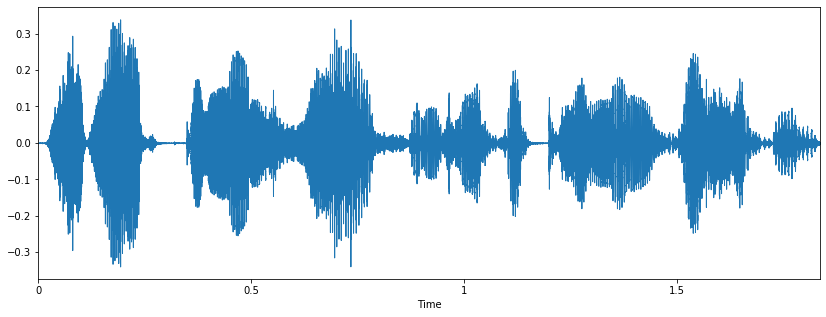

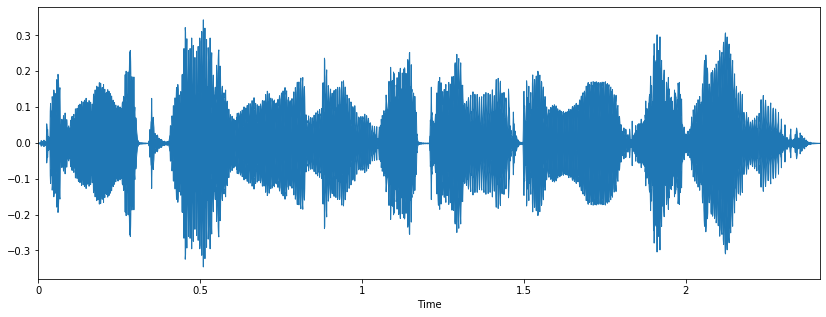

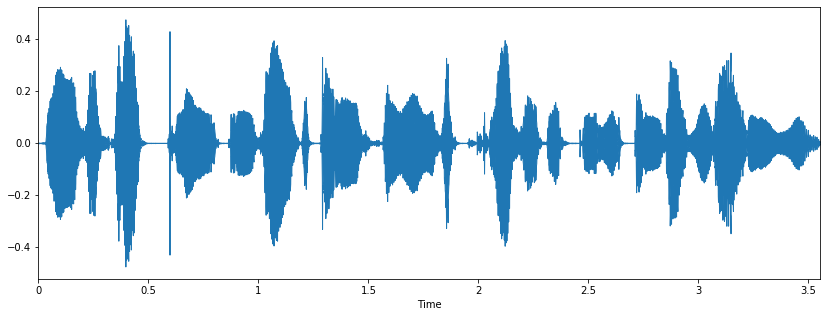

In [50]:
y6_split = split_audio_to_list(y6, db=40)
show_trimmed(y6, y6_split)